<a href="https://colab.research.google.com/github/phamdung1707/GAN/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [83]:
import torch
from torch import nn

import math
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
import pickle as pkl
import numpy as np

In [84]:
torch.manual_seed(111)

In [85]:
device = ""
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

In [86]:
transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]
)
train_set = torchvision.datasets.MNIST(
    root=".", train=True, download=True, transform=transform
)
batch_size = 32
train_loader = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True
)

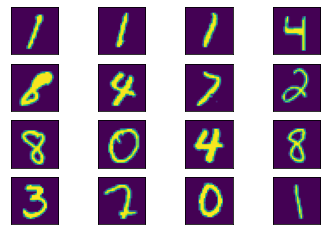

In [87]:
real_samples, mnist_labels = next(iter(train_loader))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(real_samples[i].reshape(28, 28))
    plt.xticks([])
    plt.yticks([])

In [88]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(784, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = x.view(x.size(0), 784)
        output = self.model(x)
        return output

In [89]:
discriminator = Discriminator().to(device=device)

In [90]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )

    def forward(self, x):
        output = self.model(x)
        output = output.view(x.size(0), 1, 28, 28)
        return output

In [91]:
generator = Generator().to(device=device)

In [92]:
lr = 0.0003
num_epochs = 100
loss_function = nn.BCELoss()

optimizer_discriminator = torch.optim.Adam(discriminator.parameters(), lr=lr)
optimizer_generator = torch.optim.Adam(generator.parameters(), lr=lr)

In [93]:
def showImages(image):
    image = torchvision.utils.make_grid(image)
    np_image = image.numpy()
    plt.figure(figsize=(8, 8))
    plt.imshow((np.transpose(np_image, (1, 2, 0)) * 255).astype(np.uint8))
    plt.xticks([])
    plt.yticks([])
    plt.show()

Epoch: 0
    Loss D: 0.28450602293014526
    Loss G: 2.6088669300079346


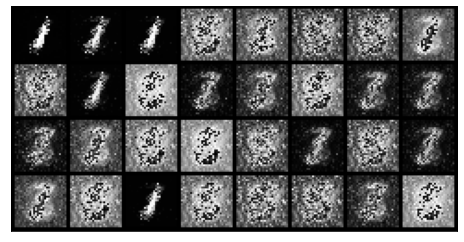


Epoch: 1
    Loss D: 0.1493193507194519
    Loss G: 2.39310359954834


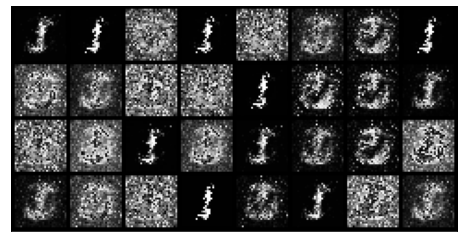


Epoch: 2
    Loss D: 0.32220929861068726
    Loss G: 1.7445449829101562


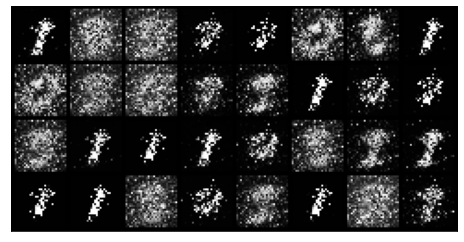


Epoch: 3
    Loss D: 0.5362501740455627
    Loss G: 1.096422791481018


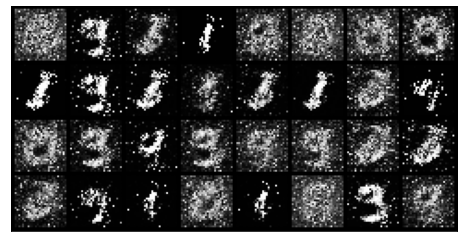


Epoch: 4
    Loss D: 0.32572755217552185
    Loss G: 1.906142234802246


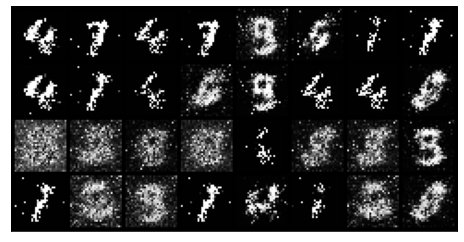


Epoch: 5
    Loss D: 0.5307540893554688
    Loss G: 1.1960240602493286


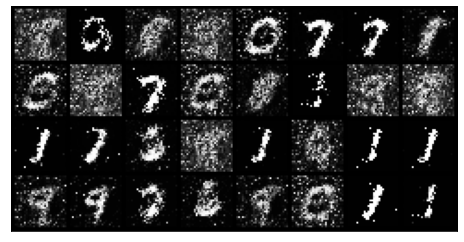


Epoch: 6
    Loss D: 0.5276662111282349
    Loss G: 1.2947425842285156


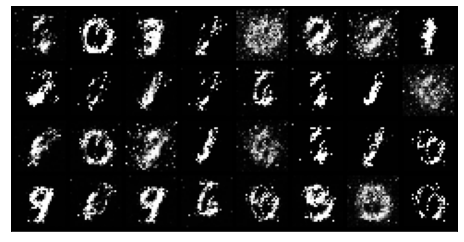


Epoch: 7
    Loss D: 0.5898789763450623
    Loss G: 0.9302792549133301


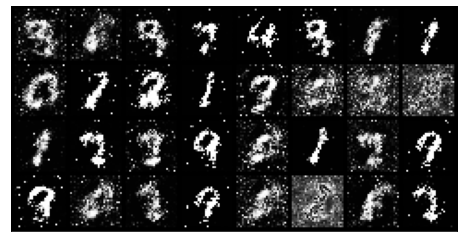


Epoch: 8
    Loss D: 0.6198936700820923
    Loss G: 0.8708190321922302


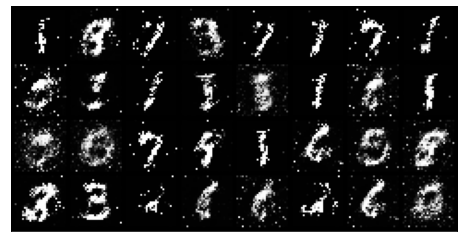


Epoch: 9
    Loss D: 0.5564355850219727
    Loss G: 1.0812147855758667


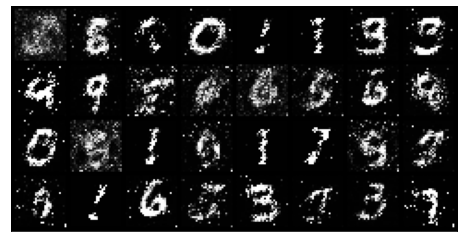


Epoch: 10
    Loss D: 0.5508564710617065
    Loss G: 0.9727172255516052


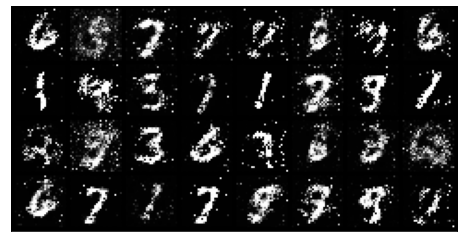


Epoch: 11
    Loss D: 0.5859081149101257
    Loss G: 0.8189406991004944


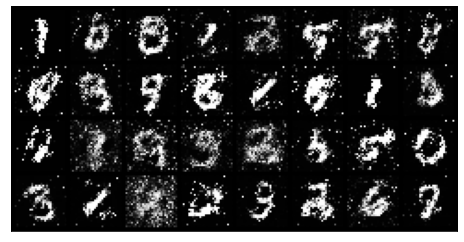


Epoch: 12
    Loss D: 0.6273260116577148
    Loss G: 0.7851037383079529


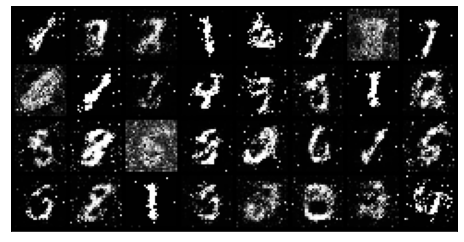


Epoch: 13
    Loss D: 0.5904092192649841
    Loss G: 1.0523122549057007


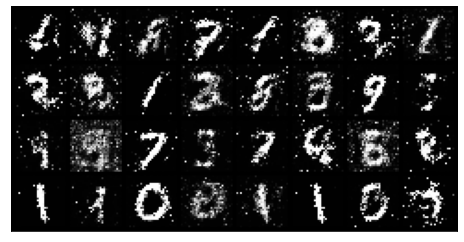


Epoch: 14
    Loss D: 0.6158354878425598
    Loss G: 0.9401581287384033


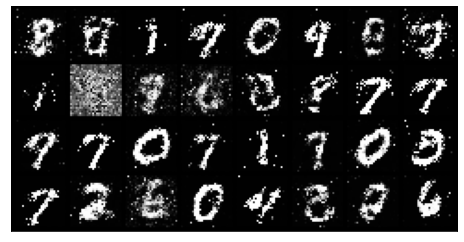


Epoch: 15
    Loss D: 0.6042285561561584
    Loss G: 0.9084905385971069


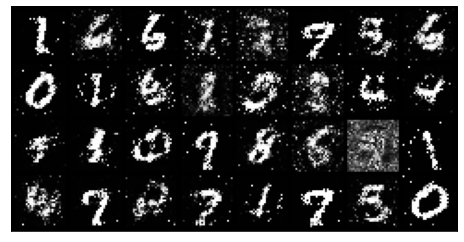


Epoch: 16
    Loss D: 0.5870974063873291
    Loss G: 0.8762183785438538


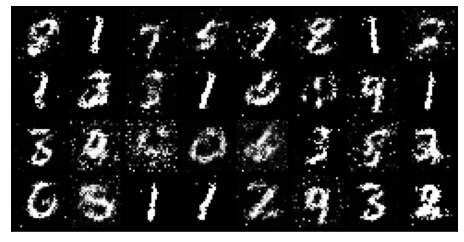


Epoch: 17
    Loss D: 0.5791361927986145
    Loss G: 1.0053317546844482


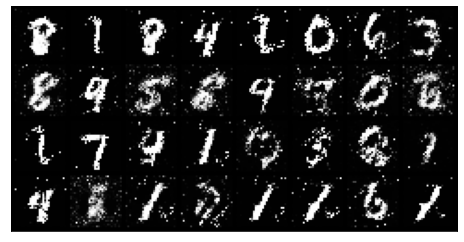


Epoch: 18
    Loss D: 0.5901625156402588
    Loss G: 0.7781973481178284


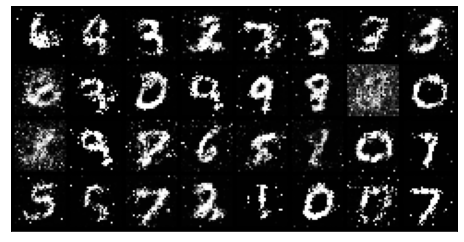


Epoch: 19
    Loss D: 0.6325170397758484
    Loss G: 0.9871602654457092


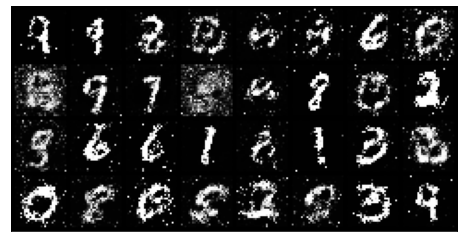


Epoch: 20
    Loss D: 0.6750298142433167
    Loss G: 0.8038923740386963


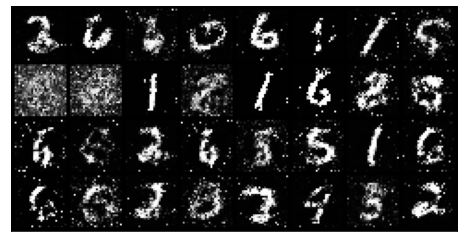


Epoch: 21
    Loss D: 0.6610249280929565
    Loss G: 1.111384391784668


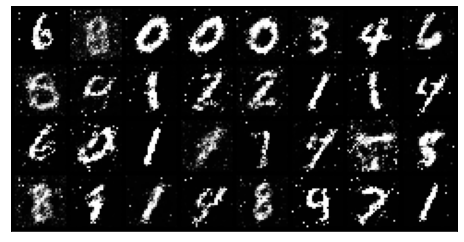


Epoch: 22
    Loss D: 0.6996200680732727
    Loss G: 0.8864991664886475


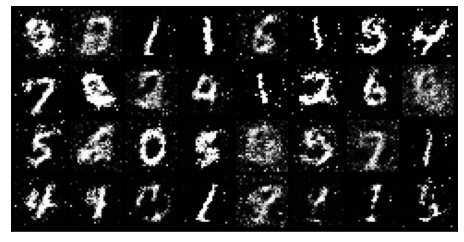


Epoch: 23
    Loss D: 0.6277918815612793
    Loss G: 0.8297101259231567


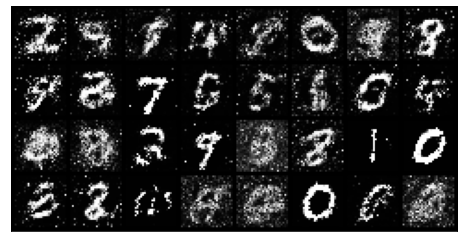


Epoch: 24
    Loss D: 0.6228501796722412
    Loss G: 0.9985984563827515


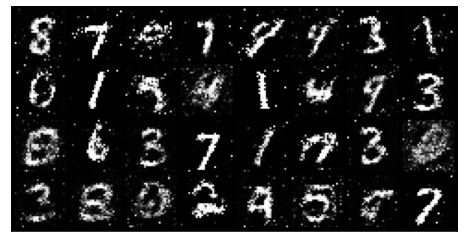


Epoch: 25
    Loss D: 0.5903579592704773
    Loss G: 0.9572356939315796


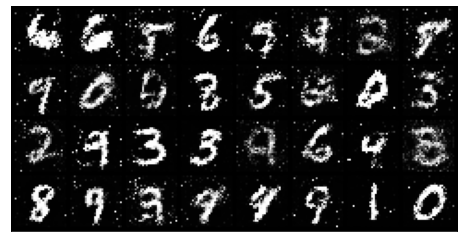


Epoch: 26
    Loss D: 0.6346888542175293
    Loss G: 0.8776801228523254


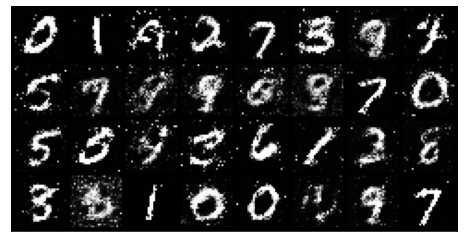


Epoch: 27
    Loss D: 0.6559691429138184
    Loss G: 0.844435453414917


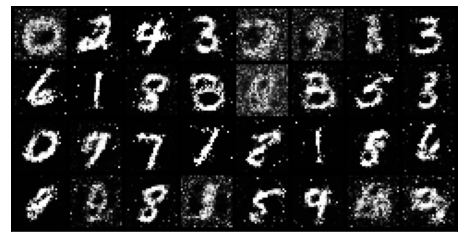


Epoch: 28
    Loss D: 0.6678326725959778
    Loss G: 0.8259100914001465


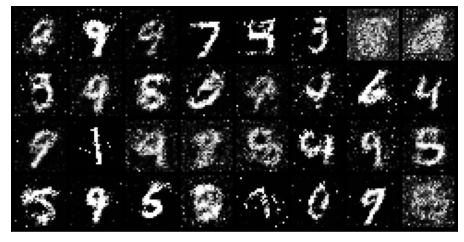


Epoch: 29
    Loss D: 0.6421417593955994
    Loss G: 0.9295152425765991


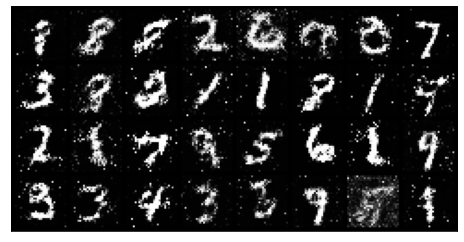


Epoch: 30
    Loss D: 0.6815668344497681
    Loss G: 0.7346267700195312


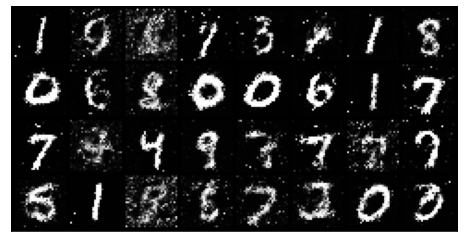


Epoch: 31
    Loss D: 0.6096781492233276
    Loss G: 0.9922382235527039


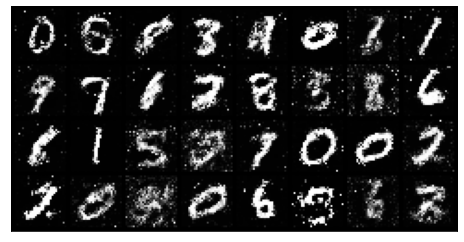


Epoch: 32
    Loss D: 0.6056076288223267
    Loss G: 0.8619940876960754


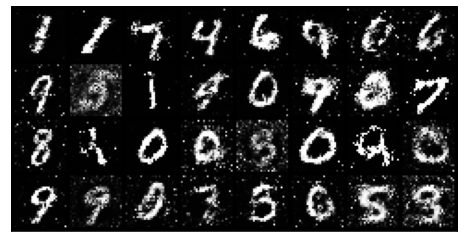


Epoch: 33
    Loss D: 0.6462024450302124
    Loss G: 0.8654761910438538


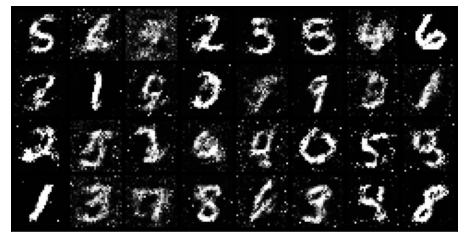


Epoch: 34
    Loss D: 0.6387597918510437
    Loss G: 0.7144500017166138


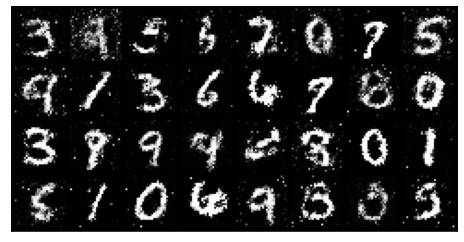


Epoch: 35
    Loss D: 0.6490309238433838
    Loss G: 0.8410940170288086


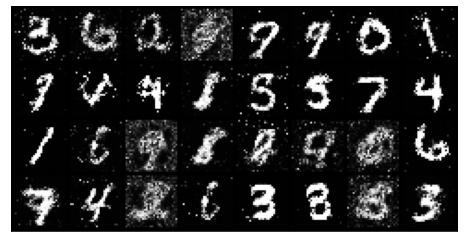


Epoch: 36
    Loss D: 0.625065267086029
    Loss G: 0.8577321171760559


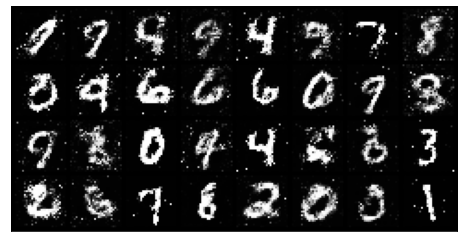


Epoch: 37
    Loss D: 0.6922459602355957
    Loss G: 0.7756776213645935


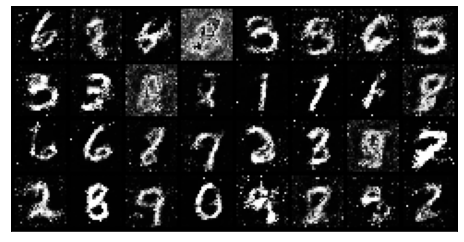


Epoch: 38
    Loss D: 0.6599208116531372
    Loss G: 0.8303038477897644


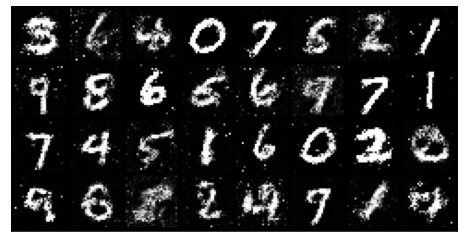


Epoch: 39
    Loss D: 0.6899885535240173
    Loss G: 0.9409056305885315


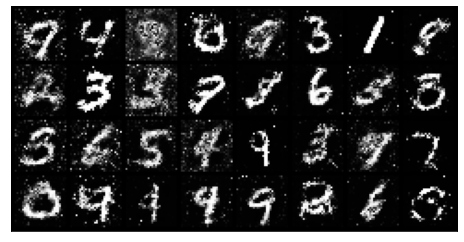


Epoch: 40
    Loss D: 0.6708914637565613
    Loss G: 0.770923376083374


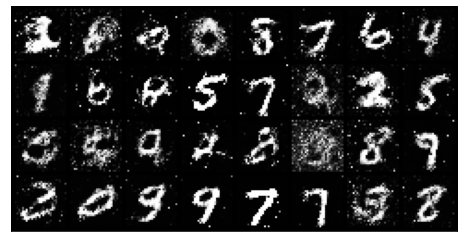


Epoch: 41
    Loss D: 0.7278234958648682
    Loss G: 0.882860004901886


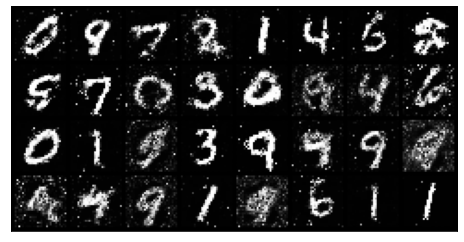


Epoch: 42
    Loss D: 0.6842999458312988
    Loss G: 0.7182693481445312


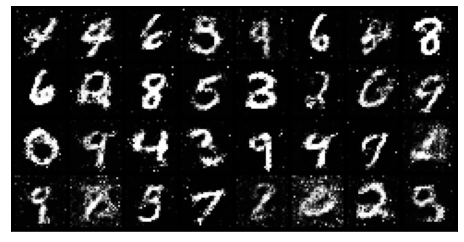


Epoch: 43
    Loss D: 0.6691353917121887
    Loss G: 0.8216517567634583


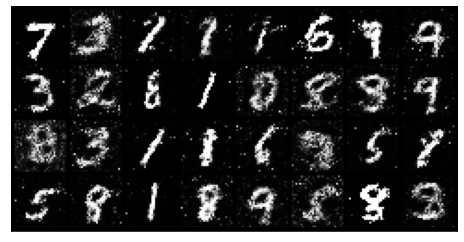


Epoch: 44
    Loss D: 0.666330873966217
    Loss G: 0.7906221151351929


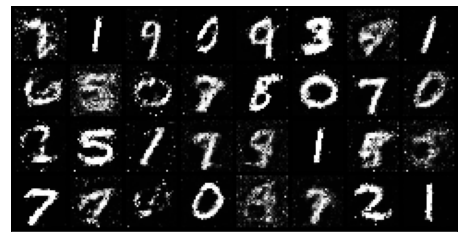


Epoch: 45
    Loss D: 0.672170877456665
    Loss G: 0.9409602284431458


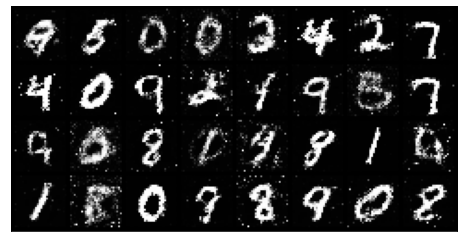


Epoch: 46
    Loss D: 0.6464650630950928
    Loss G: 0.8861512541770935


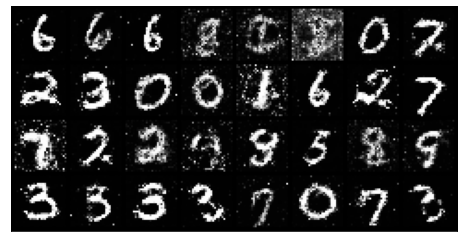


Epoch: 47
    Loss D: 0.6579781174659729
    Loss G: 0.8184856176376343


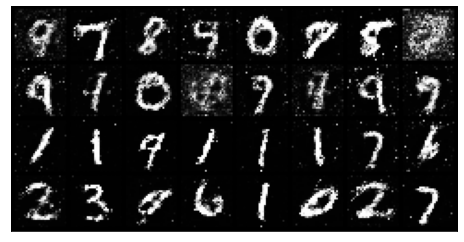


Epoch: 48
    Loss D: 0.7128726243972778
    Loss G: 0.7280369400978088


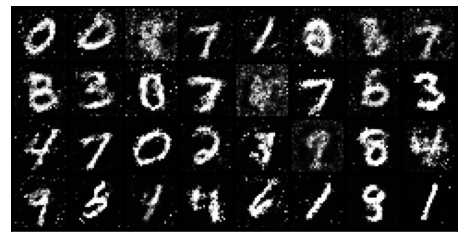


Epoch: 49
    Loss D: 0.653761625289917
    Loss G: 0.7264394760131836


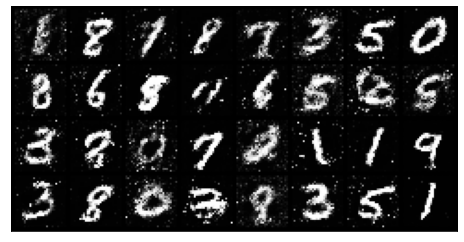


Epoch: 50
    Loss D: 0.5964937806129456
    Loss G: 0.8615052103996277


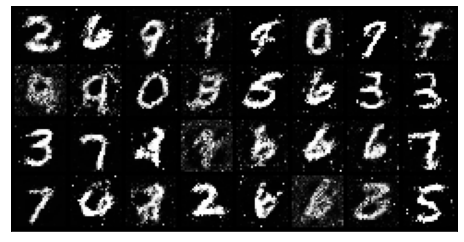


Epoch: 51
    Loss D: 0.6602979898452759
    Loss G: 0.8642959594726562


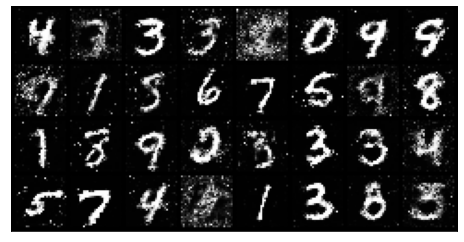


Epoch: 52
    Loss D: 0.6513634920120239
    Loss G: 0.8010779023170471


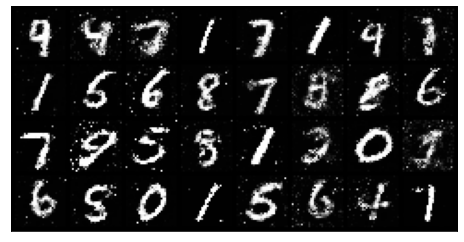


Epoch: 53
    Loss D: 0.6349537968635559
    Loss G: 0.8968971967697144


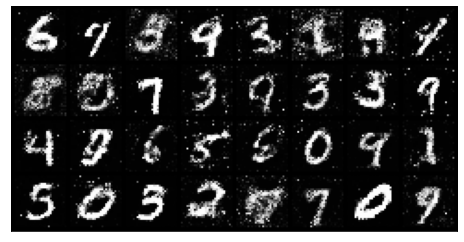


Epoch: 54
    Loss D: 0.6486170291900635
    Loss G: 0.9311568737030029


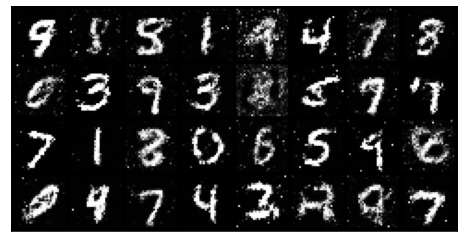


Epoch: 55
    Loss D: 0.6287453174591064
    Loss G: 0.9424237012863159


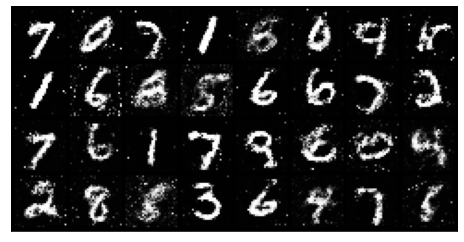


Epoch: 56
    Loss D: 0.6537567973136902
    Loss G: 0.8834564685821533


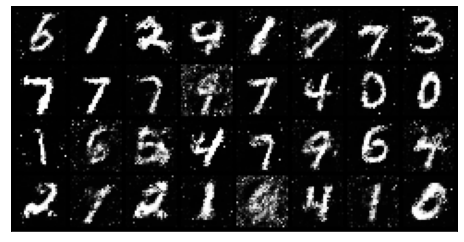


Epoch: 57
    Loss D: 0.693981945514679
    Loss G: 0.8393501043319702


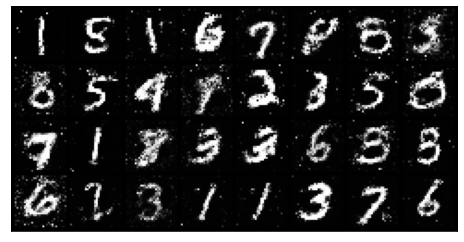


Epoch: 58
    Loss D: 0.6318492889404297
    Loss G: 0.8820926547050476


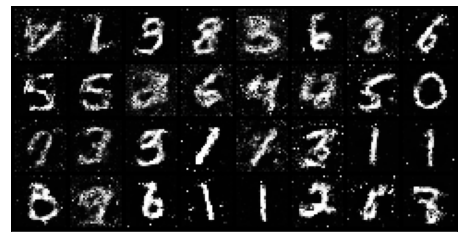


Epoch: 59
    Loss D: 0.6848582625389099
    Loss G: 0.9622058868408203


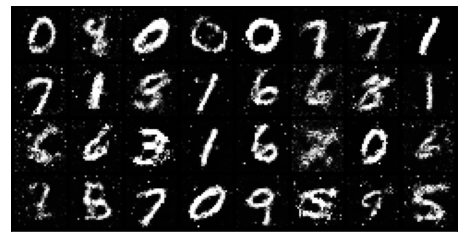


Epoch: 60
    Loss D: 0.679129421710968
    Loss G: 0.847244381904602


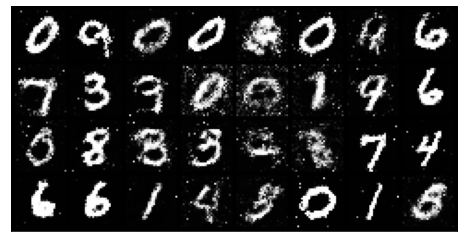


Epoch: 61
    Loss D: 0.6889876127243042
    Loss G: 0.8652056455612183


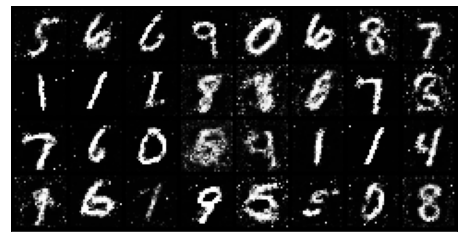


Epoch: 62
    Loss D: 0.6665146350860596
    Loss G: 0.7498505115509033


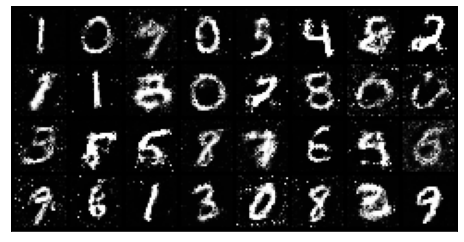


Epoch: 63
    Loss D: 0.6830717325210571
    Loss G: 0.854649007320404


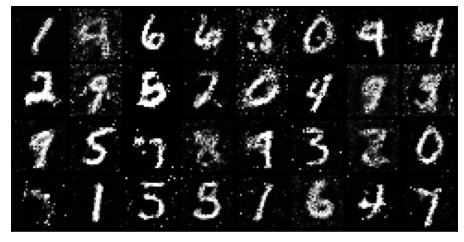


Epoch: 64
    Loss D: 0.58982253074646
    Loss G: 0.9239087700843811


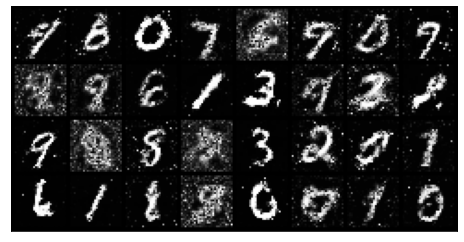


Epoch: 65
    Loss D: 0.7018455266952515
    Loss G: 0.9444974064826965


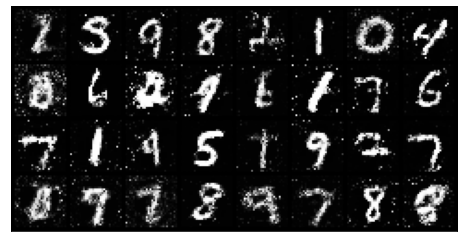


Epoch: 66
    Loss D: 0.6399204730987549
    Loss G: 0.8012378811836243


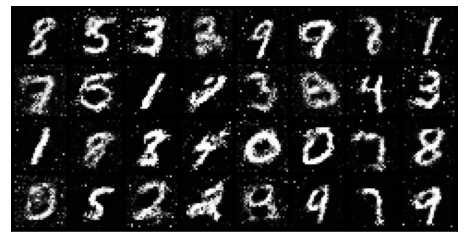


Epoch: 67
    Loss D: 0.6714605689048767
    Loss G: 0.9173451066017151


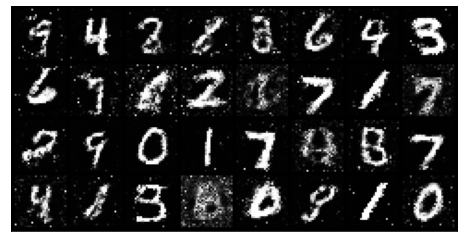


Epoch: 68
    Loss D: 0.6325363516807556
    Loss G: 0.8055346608161926


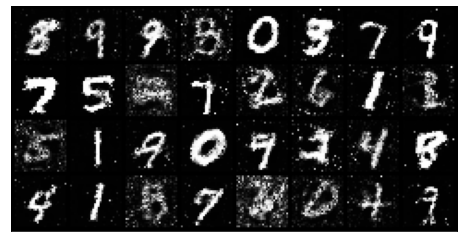


Epoch: 69
    Loss D: 0.6716891527175903
    Loss G: 0.7515426278114319


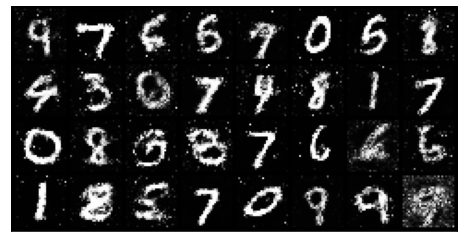


Epoch: 70
    Loss D: 0.5721117258071899
    Loss G: 0.8531394004821777


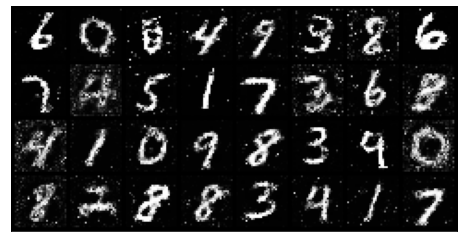


Epoch: 71
    Loss D: 0.6647022366523743
    Loss G: 1.0349980592727661


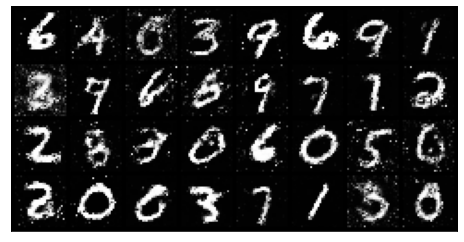


Epoch: 72
    Loss D: 0.6571439504623413
    Loss G: 0.6741146445274353


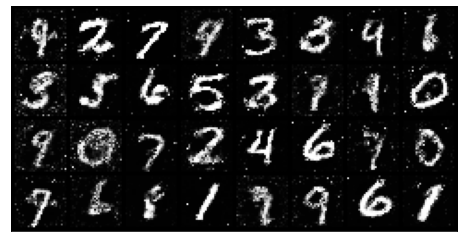


Epoch: 73
    Loss D: 0.6304938793182373
    Loss G: 0.7728949189186096


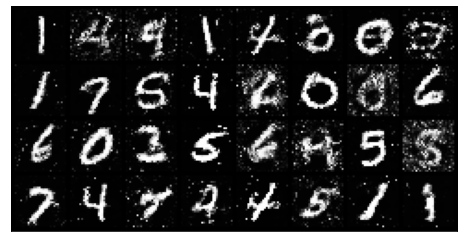


Epoch: 74
    Loss D: 0.6061113476753235
    Loss G: 0.8822631239891052


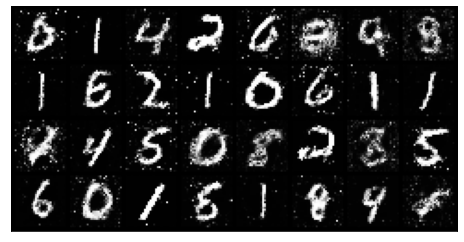


Epoch: 75
    Loss D: 0.6583746075630188
    Loss G: 0.7800865173339844


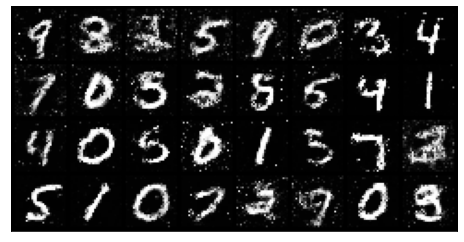


Epoch: 76
    Loss D: 0.6622569561004639
    Loss G: 0.9871349334716797


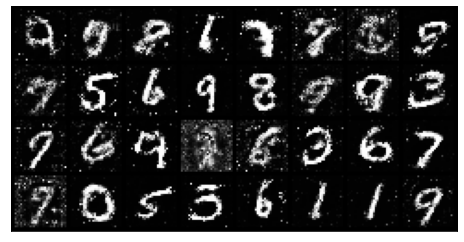


Epoch: 77
    Loss D: 0.5887185335159302
    Loss G: 0.8735790252685547


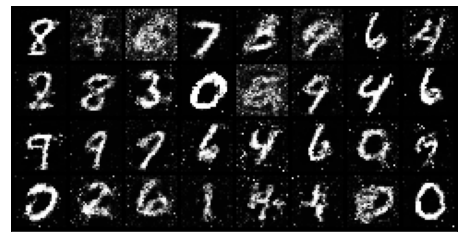


Epoch: 78
    Loss D: 0.6578457355499268
    Loss G: 1.0191712379455566


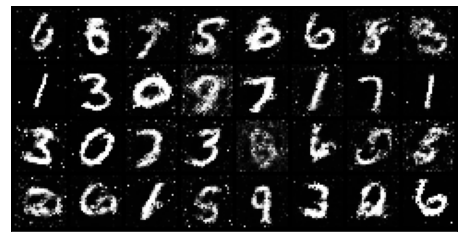


Epoch: 79
    Loss D: 0.6552897691726685
    Loss G: 0.7777188420295715


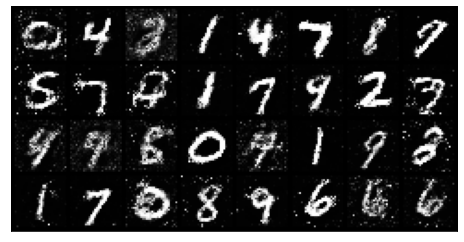


Epoch: 80
    Loss D: 0.6711084842681885
    Loss G: 1.0721042156219482


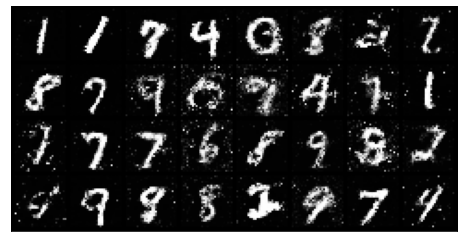


Epoch: 81
    Loss D: 0.6632164716720581
    Loss G: 0.8908318281173706


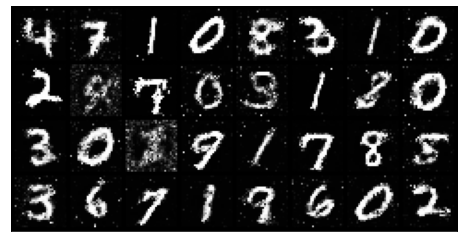


Epoch: 82
    Loss D: 0.6724580526351929
    Loss G: 0.9294769167900085


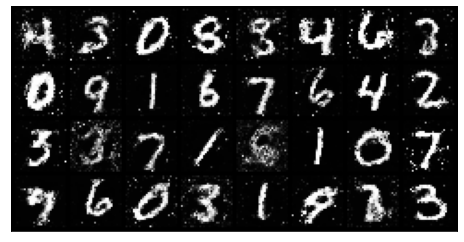


Epoch: 83
    Loss D: 0.5717165470123291
    Loss G: 0.9062913656234741


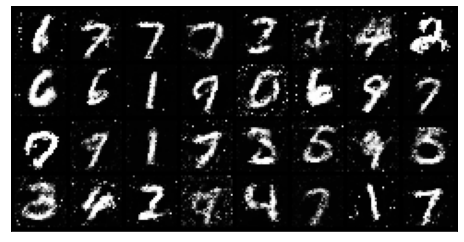


Epoch: 84
    Loss D: 0.6621371507644653
    Loss G: 0.8952134251594543


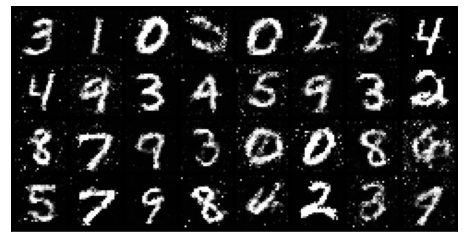


Epoch: 85
    Loss D: 0.7071616649627686
    Loss G: 0.8005855679512024


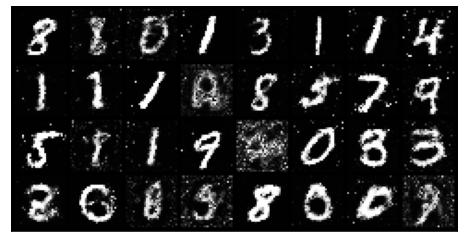


Epoch: 86
    Loss D: 0.5988028645515442
    Loss G: 0.785988986492157


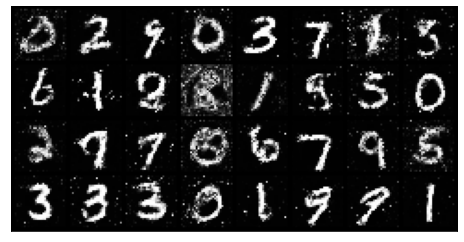


Epoch: 87
    Loss D: 0.6901111602783203
    Loss G: 0.7913651466369629


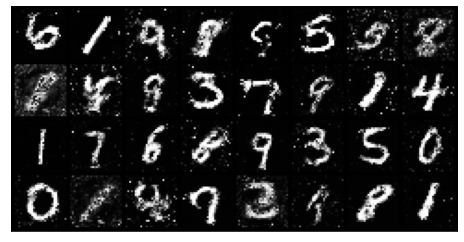


Epoch: 88
    Loss D: 0.6651116013526917
    Loss G: 0.8973637223243713


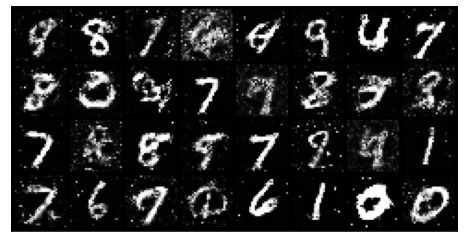


Epoch: 89
    Loss D: 0.6350178718566895
    Loss G: 0.8652205467224121


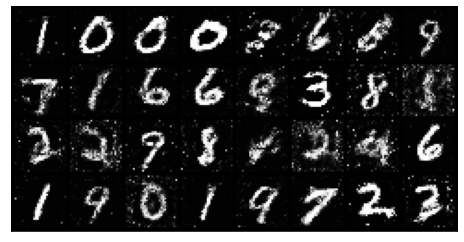


Epoch: 90
    Loss D: 0.6102083921432495
    Loss G: 0.7616948485374451


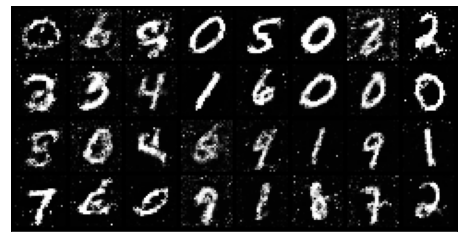


Epoch: 91
    Loss D: 0.6050549745559692
    Loss G: 0.8337668180465698


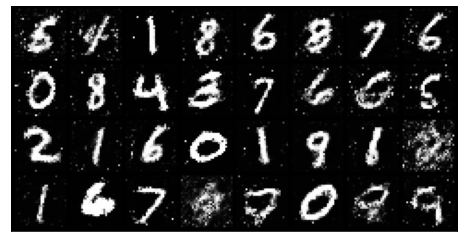


Epoch: 92
    Loss D: 0.7048140168190002
    Loss G: 0.9966540336608887


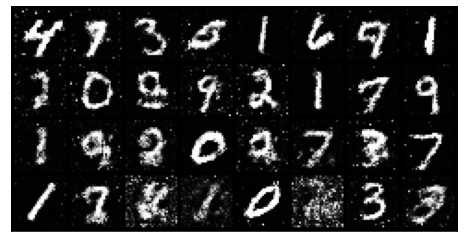


Epoch: 93
    Loss D: 0.5952272415161133
    Loss G: 0.8399017453193665


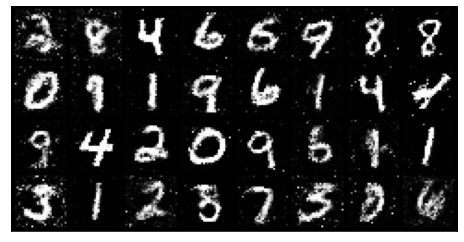


Epoch: 94
    Loss D: 0.6733974814414978
    Loss G: 0.9225554466247559


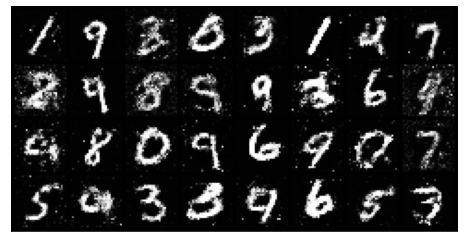


Epoch: 95
    Loss D: 0.6284646391868591
    Loss G: 0.8422582149505615


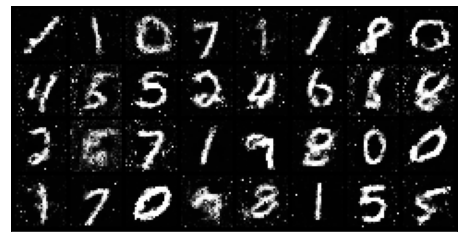


Epoch: 96
    Loss D: 0.6301342248916626
    Loss G: 0.78664231300354


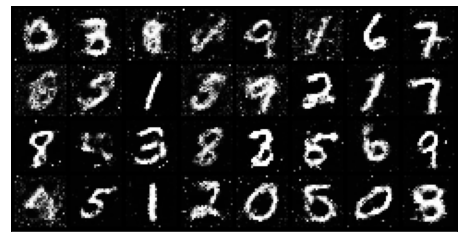


Epoch: 97
    Loss D: 0.7027758359909058
    Loss G: 0.7466476559638977


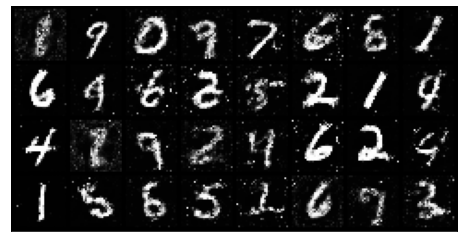


Epoch: 98
    Loss D: 0.6910881400108337
    Loss G: 0.8255366683006287


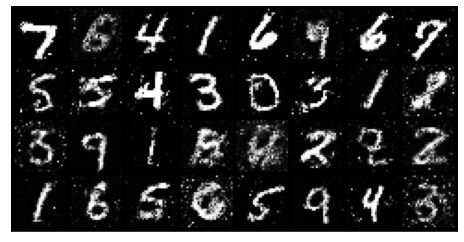


Epoch: 99
    Loss D: 0.6611153483390808
    Loss G: 0.8641484975814819


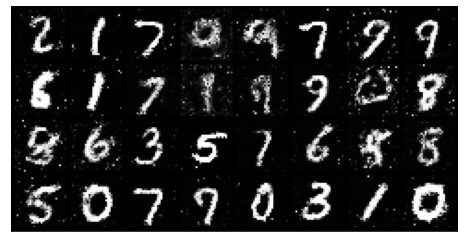

In [94]:
img_list=[]
for epoch in range(num_epochs):
    print(f"Epoch: {epoch}")
    loss_discriminator = 0.0
    loss_generator = 0.0

    for n, (real_samples, mnist_labels) in enumerate(train_loader):
        # Data for training the discriminator
        real_samples = real_samples.to(device=device)
        real_samples_labels = torch.ones((batch_size, 1)).to(
            device=device
        )
        noises = torch.randn((batch_size, 100)).to(
            device=device
        )
        generated_samples = generator(noises)
        generated_samples_labels = torch.zeros((batch_size, 1)).to(
            device=device
        )
        all_samples = torch.cat((real_samples, generated_samples))
        all_samples_labels = torch.cat(
            (real_samples_labels, generated_samples_labels)
        )

        # Training the discriminator
        discriminator.zero_grad()
        output_discriminator = discriminator(all_samples)
        loss_discriminator = loss_function(
            output_discriminator, all_samples_labels
        )
        loss_discriminator.backward()
        optimizer_discriminator.step()

        # Data for training the generator
        noises = torch.randn((batch_size, 100)).to(
            device=device
        )

        # Training the generator
        generator.zero_grad()
        generated_samples = generator(noises)
        output_discriminator_generated = discriminator(generated_samples)
        loss_generator = loss_function(
            output_discriminator_generated, real_samples_labels
        )
        loss_generator.backward()
        optimizer_generator.step()
      
    # Show loss
    print(f"    Loss D: {loss_discriminator}")
    print(f"    Loss G: {loss_generator}")
    samples = torch.randn(batch_size, 100).to(device=device)
    imgs = generator(samples).detach()
    imgs = imgs.view(imgs.size(0), 1, 28, 28).cpu()
    showImages(imgs)
    print()
